In [1]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import random
import sympy as sp

from collections import defaultdict
from functools import partial
from itertools import chain
from IPython.display import HTML
from matplotlib.animation import FuncAnimation
from numba import jit
from scipy.integrate import RK23
from tqdm.notebook import tqdm

%matplotlib inline

In [2]:
plt.style.use('bmh')
plt.rcParams['font.size'] = 14

In [3]:
MASS = 1.  # set particle mass to 1. for simplicity
EPS = 0.1  # step size
DELTA_MAX = 1000.  # used for stopping criterion on low prob. particles

In [4]:
x, y = sp.symbols('x y', real=True)

pdf = sp.exp(-sp.Rational(1 / 2) * (x ** 2 + y ** 2)) / (2 * sp.pi)  # a simple symmetric 2D gaussian with identity covariance

In [5]:
potential_energy = -sp.log(pdf)  # define the potential energy as the negative log pdf
potential_energy.simplify()

x**2/2 + y**2/2 + log(2*pi)

In [6]:
px, py, m = sp.symbols('p_x p_y m', real=True)  # define momenta and mass symbols

M = m * sp.eye(2)  # mass matrix
p = sp.Matrix([px, py])  # momentum vector

In [7]:
kinetic_energy = sp.Rational(1 / 2) * p.transpose() * M.inv() * p  # T = p ** 2 / (2m)
kinetic_energy = kinetic_energy[0, 0]  # squeeze the scalar out of the matrix
kinetic_energy.simplify()

(p_x**2 + p_y**2)/(2*m)

In [8]:
H = potential_energy + kinetic_energy  # define the Hamiltonian
H.simplify()

(m*(x**2 + y**2 + 2*log(2) + 2*log(pi)) + p_x**2 + p_y**2)/(2*m)

In [9]:
state_vars = [[x, y], [px, py]]
signs = [1, 1, -1, -1]

dynamics = sp.Matrix(  # form rhs of hamiltons equations
        [
            (sign * H.diff(var)).simplify() for sign, var in zip(signs, chain(*reversed(state_vars)))
        ]   
)
dynamics 

Matrix([
[p_x/m],
[p_y/m],
[   -x],
[   -y]])

In [10]:
# sub for mass
dynamics = dynamics.subs(m, MASS)
M = M.subs(m, MASS)
H = H.subs(m, MASS)
sigma = np.diag(np.array(M, dtype=np.float64))

In [11]:
def gradient(func, syms):
    return sp.Matrix([func.diff(sym).simplify() for sym in syms])

In [12]:
force_field = -gradient(potential_energy, [x, y])
force_field

Matrix([
[-x],
[-y]])

In [13]:
pdf = sp.lambdify([x, y], pdf, 'numpy')

In [14]:
force_field = sp.lambdify([x, y], force_field, 'numpy')

In [15]:
dynamics = sp.lambdify(list(chain(*state_vars)), dynamics, 'numpy')

In [16]:
H = sp.lambdify(list(chain(*state_vars)), H, 'numpy')

In [17]:
def compute_dynamics(t, z):
    return dynamics(*z).squeeze()

Text(0.5, 1.0, '$\\mathcal{N}(\\mathbf{0}, \\mathbf{I})$')

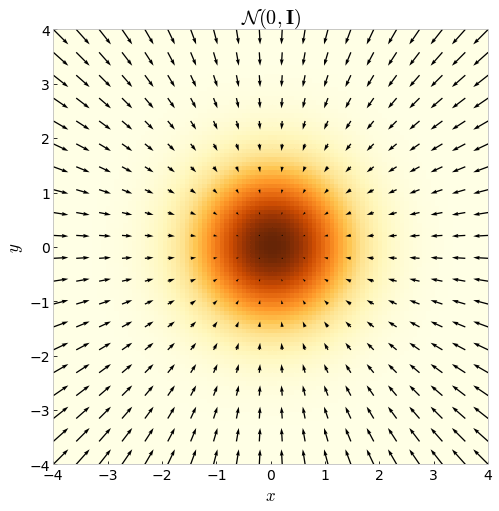

In [18]:
X_cont, Y_cont = np.mgrid[-4:4:100j, -4:4:100j]
X_quiv, Y_quiv = np.mgrid[-4:4:20j, -4:4:20j]

Fx, Fy = force_field(X_quiv, Y_quiv).squeeze()

fig, ax = plt.subplots(figsize=(8, 8))
ax.pcolormesh(X_cont, Y_cont, pdf(X_cont, Y_cont), cmap='YlOrBr')
ax.quiver(X_quiv, Y_quiv, Fx, Fy, label='force')
ax.set_xlabel('$x$')
ax.set_ylabel('$y$')
ax.set_aspect('equal')
ax.set_title('$\\mathcal{N}(\\mathbf{0}, \\mathbf{I})$')

In [19]:
# not leapfrog, but a different second order method for integrating the ODEs

def step(theta, r, v):
    solver = RK23(
        fun=compute_dynamics,
        t0=0,
        y0=np.r_[theta, r],
        max_step=EPS,
        first_step=EPS,
        t_bound=v * EPS,
        atol=1e12,  # trick to avoid internal step size adaptation
        rtol=1e12
    )
    solver.step()
    return np.split(solver.y, 2)

In [20]:
ALL_ARTISTS = []
SAMPLE_ARTISTS = None

In [21]:
def build_tree(theta, r, u, v, j, hamiltonian):
    global SAMPLE_ARTISTS
    if j == 0:
        theta, r = step(theta, r, v)
        c = {(tuple(theta), tuple(r))} if u <= np.exp(-hamiltonian(*theta, *r)) else {}
        s = -hamiltonian(*theta, *r) > (np.log(u) - DELTA_MAX)
        new_pt = mpl.lines.Line2D(
            [theta[0]], 
            [theta[1]], 
            color=('m' if v == 1 else 'c'), 
            marker='o', 
            zorder=1,
            alpha=0.7
        )
        SAMPLE_ARTISTS.append(new_pt)
        if not s:
            bad_pt = mpl.lines.Line2D([theta[0]], [theta[1]], color='r', marker='x', zorder=3)
            SAMPLE_ARTISTS.append(bad_pt)
        return theta, r, theta, r, c, s
    else:
        theta_minus, r_minus, theta_plus, r_plus, c, s = build_tree(theta, r, u, v, j - 1, hamiltonian)
        if v == -1:
            theta_minus, r_minus, _, _, c_prime, s_prime = build_tree(theta_minus, r_minus, u, v, j - 1, hamiltonian)
        else:
            _, _, theta_plus, r_plus, c_prime, s_prime = build_tree(theta_plus, r_plus, u, v, j - 1, hamiltonian)
        s = s and s_prime and ((theta_plus - theta_minus).dot(r_plus) >= 0) and ((theta_plus - theta_minus).dot(r_minus) >= 0)
        c = c | c_prime
        return theta_minus, r_minus, theta_plus, r_plus, c, s

In [22]:
def nuts_sample_fn(init_pos, hamiltonian, prop_width, num_samples=1000):
    global ALL_ARTISTS
    global SAMPLE_ARTISTS
    h = hamiltonian
    sigma = np.ones(shape=len(init_pos)) * prop_width
    samples = np.empty(shape=(num_samples, len(init_pos) * 2))
    theta = init_pos
    for k in tqdm(range(num_samples)):
        
        SAMPLE_ARTISTS = []
        start_pt = mpl.patches.Circle(xy=(theta[0], theta[1]), radius=0.05, color='b')
        
        r = np.random.normal(scale=sigma)
        u = np.random.uniform(low=0, high=np.exp(-h(*theta, *r)))
        s = True
        theta_minus, r_minus, theta_plus, r_plus = theta, r, theta, r
        c = {(tuple(theta), tuple(r))}
        j = 0
        while s:
            v = np.random.choice([-1, 1])
            if v == -1:
                theta_minus, r_minus, _, _, c_prime, s_prime = build_tree(theta_minus, r_minus, u, v, j, h)
            else:
                _, _, theta_plus, r_plus, c_prime, s_prime = build_tree(theta_plus, r_plus, u, v, j, h)
            turn_right = ((theta_plus - theta_minus).dot(r_plus) >= 0)
            turn_left = ((theta_plus - theta_minus).dot(r_minus) >= 0)
            s = s_prime and turn_right and turn_left
            if s_prime:
                c = c | c_prime
            j += 1
            
        sample = random.choice(list(c))
        
        arrow = mpl.patches.Arrow(
            x=theta[0], 
            y=theta[1], 
            dx=(sample[0][0] - theta[0]), 
            dy=(sample[0][1] - theta[1]),
            width=0.1,
            color='k',
            zorder=3
        )
        
        end_pt = mpl.patches.Circle(xy=(sample[0][0], sample[0][1]), radius=0.05, color='b')
        samples[k] = np.concatenate(sample)
        theta = np.array(sample[0])
        
        SAMPLE_ARTISTS.extend([mpl.collections.PatchCollection([start_pt, end_pt]), arrow])
        ALL_ARTISTS.append(SAMPLE_ARTISTS)
        
    return samples

In [23]:
init_state = np.array([1., 1.])
sample = partial(nuts_sample_fn, hamiltonian=H)
samples = sample(init_state, prop_width=1., num_samples=100)

In [24]:
def animate(seq_id):
    new_artists = ALL_ARTISTS[seq_id]
    ax.patches = []
    ax.lines = []
    for coll in ax.collections:
        if isinstance(coll, mpl.collections.PatchCollection):
            coll.set_alpha(0.35)
    for artist in new_artists:
        if isinstance(artist, mpl.lines.Line2D):
            ax.add_line(artist)
        elif isinstance(artist, mpl.patches.Patch):
            ax.add_patch(artist)
        else:
            ax.add_collection(artist)

In [25]:
animation = mpl.animation.FuncAnimation(fig, animate, interval=500, blit=False, frames=len(ALL_ARTISTS))
js_html = animation.to_jshtml()
HTML(js_html)